# Clustering transformed offsets

This was the first attempt to derive the IR offsets from the RGZ catalogue and the apply the transform information obtained by PINK. 

The idea is that if the radio/IR channels from PINK are doing a good job at characterising the types of features, then the offsets of the IR components to the radio components in the SOM can be used to estimate the RA/Dec position of the IR host of a radio component. 

To verify this idea, we are overlaying the RGZ IR host information onto the learnt IR neurons. If they agree well, then we have good evidence to suggest that this will be a potential option to explore for future cross matching and cataloging. 

In [1]:
%matplotlib inline
import matplotlib as mpl
print(mpl.__version__)
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import gaussian_kde_weights 
from scipy.stats import gaussian_kde
import pink_utils as pu
import astropy.units as u
from tqdm import tqdm
from collections import defaultdict
from astropy.coordinates import SkyCoord
from collections import Counter

2.2.2


In [2]:
FIRST_PIX = 1.8*u.arcsecond # Pixel size of FIRST survey. Square pixels
FIRST_FWHM = 5*u.arcsecond / FIRST_PIX
FIRST_SIG = FIRST_FWHM / 2.355

# Load the Required items in
df        = pd.read_csv('../Experiment/Experiment_F3W2_95_5/FIRST_Cata_Images.csv')
transform = pu.transform('../Experiment/Experiment_F3W2_95_5/F3W2_95_5_Transform_Matrix.bin')
ed        = pu.heatmap('../Experiment/Experiment_F3W2_95_5/F3W2_95_5_ED_Matrix.bin')
som       = pu.som('../Experiment/Experiment_F3W2_95_5/Results/F3W2_95_5/F3W2S_95_5_6.bin')
images    = pu.image_binary('../Experiment/Experiment_F3W2_95_5/Results/F3W2_95_5.bin')

print(FIRST_FWHM, FIRST_SIG)

2.7777777777777777 1.179523472517103


/Users/gal16b/miniconda3/envs/pink_e3/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3018: DtypeWarning: Columns (73,74) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


In [3]:
som.file_head
NEURON_SiZE = som.file_head[-1] # Equal dimensions 

In [4]:
def transform_dxy(dx, dy, rot_info):
    """Rotate the x and y pixels and then flip if needed
    TODO: Convert dxy / dy to center positions?

    dx, dy: Pixel offsets from the center of an image
    rot_info : tuple of flip bit and angle in radians
    """
    flip, ang = rot_info
    
    tdx = dx*np.cos(ang) - dy*np.sin(ang)
    tdy = dx*np.sin(ang) + dy*np.cos(ang)
    if flip == 1:
#         tdx = -tdx
        tdy = -tdy
    
    return tdx, tdy
    

In [5]:
def new_entry():
    return {'tdx':[], 'tdy':[], 'rows':[]}

dd = defaultdict(new_entry)

for (index, row) in tqdm(df.iterrows()):

    # Limit reached lets move on
    if index == 50000:
        break
    
    # Continue onto next source
    if row['consensus.ir_ra'] == -99:
        continue
    
    # Load and reshape the rotation matrix
    rot = transform.transform(index=index).reshape(transform.header_info[1:])

    # Load similarity matrix and find minimum
    hmap = ed.ed(index=index)
    pos_min = np.unravel_index(np.argmin(hmap), hmap.shape)

    # Get rotation informaiton of BMU
    rot_info = rot[pos_min[1], pos_min[0]][0]   
    
    # Calculate offsets of radio and IR positions
    radio_pos = SkyCoord(ra=row['radio.ra']*u.deg, dec=row['radio.dec']*u.deg, frame='icrs')
    infra_pos = SkyCoord(ra=row['consensus.ir_ra']*u.deg, dec=row['consensus.ir_dec']*u.deg, frame='icrs')
    offset_pos = radio_pos.spherical_offsets_to(infra_pos)
#     offset_pos = infra_pos.spherical_offsets_to(radio_pos)
    
    # Convert to pixels
    dra, ddec = offset_pos
    dx = dra.to(u.arcsecond) / FIRST_PIX
    dy = ddec.to(u.arcsecond) / FIRST_PIX
    
    # RA convention goes from right to left, image arrays are not
    # aware of this
    dx = -dx
    
    # Get rotation information  
    tdx, tdy = transform_dxy(dx, dy, rot_info)
    
    dd[pos_min]['tdx'].append(tdx+NEURON_SiZE//2)
    dd[pos_min]['tdy'].append(tdy+NEURON_SiZE//2)
    dd[pos_min]['rows'].append(row)

49990it [08:50, 79.54it/s] 

49990it [09:10, 79.54it/s]/Users/gal16b/miniconda3/envs/pink_e3/lib/python3.7/site-packages/matplotlib/pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
/Users/gal16b/Documents/Postdoc_Work/PINK/Experiments_Three/Notebook/gaussian_kde_weights.py:290: RuntimeWarning: invalid value encountered in true_divide
  self._data_covariance /= (1 - np.sum(self.weights ** 2))
/Users/gal16b/miniconda3/envs/pink_e3/lib/python3.7/site-packages/numpy/linalg/linalg.py:2022: RuntimeWarning: invalid value encountered in det
  r = _umath_linalg.det(a, signature=signature)


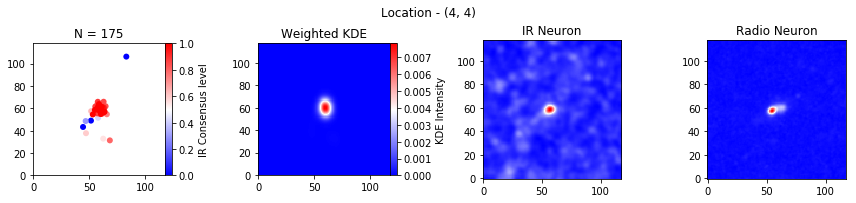

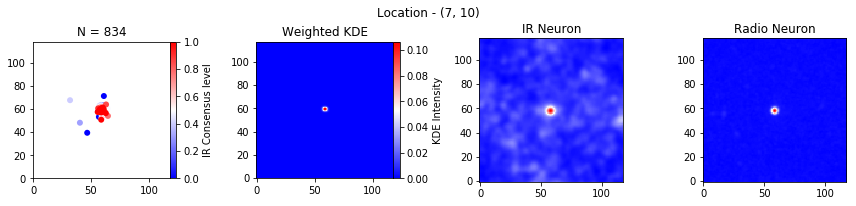

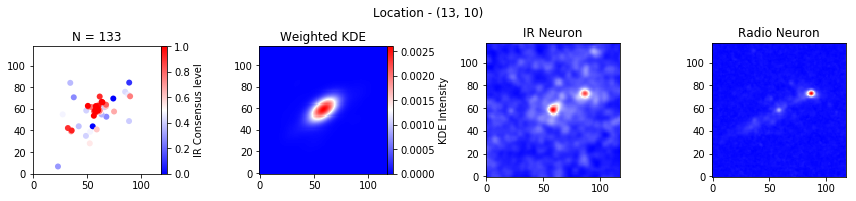

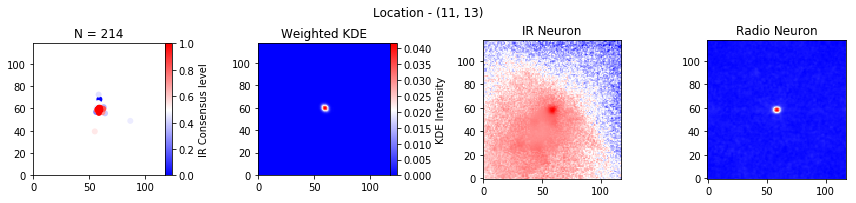

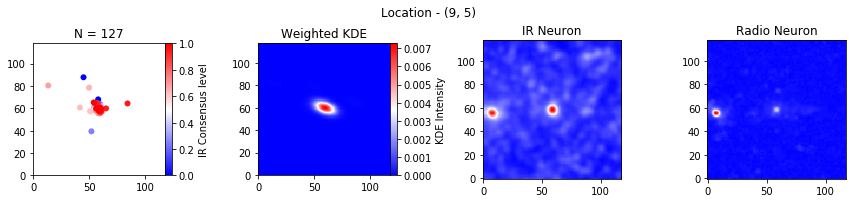

...

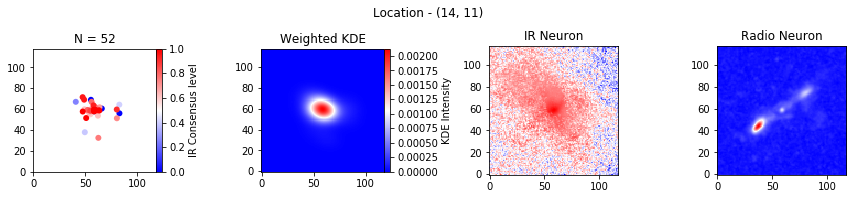

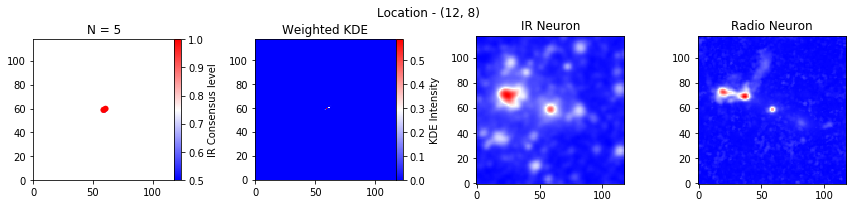

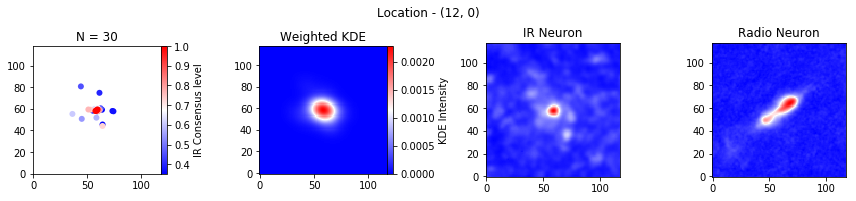

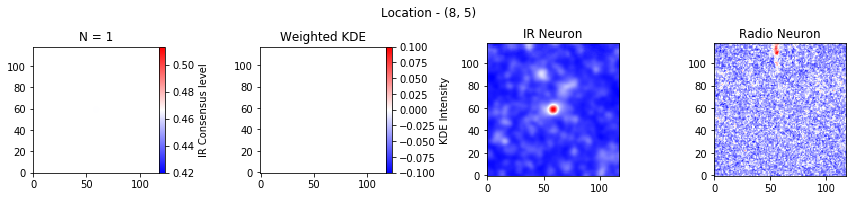

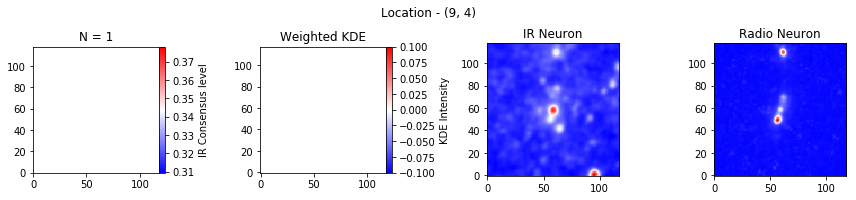

In [6]:
plt.close('all')

from mpl_toolkits.axes_grid1 import make_axes_locatable

for key in [ k for k in dd.keys()]:

    ir_neuron = som.get_neuron(x=key[0], y=key[1], channel=1)
    r_neuron = np.sqrt(som.get_neuron(x=key[0], y=key[1], channel=0))
    
    fig, (ax1, ax2, ax3, ax4) = plt.subplots(1,4, figsize=(12,3))
    
    # Calculate the point density
    tdx = np.array(dd[key]['tdx'])
    tdy = np.array(dd[key]['tdy'])
    tdweights = [i['consensus.ir_level'] for i in dd[key]['rows']]
    
    xy = np.vstack([tdx, tdy])
    kde = gaussian_kde_weights.gaussian_kde(xy, weights=tdweights, bw_method=FIRST_SIG.value)
    tdz = kde(xy)
    tdz = np.array(tdweights)
    
    # Sort by density
    index = tdz.argsort()
    tdx, tdy, tdz = tdx[index], tdy[index], tdz[index]
    
    # Make space for colorbar
    divider = make_axes_locatable(ax1)
    cax1 = divider.append_axes('right', size='5%')
    
    s = ax1.scatter(tdx, tdy, c=tdz, edgecolor='', cmap='bwr')
    ax1.set_xlim((0, NEURON_SiZE))
    ax1.set_ylim((0, NEURON_SiZE))
    ax1.set_aspect('equal')
    ax1.set(title=f"N = {len(tdx)}")
    
    cbar = fig.colorbar(s, cax=cax1, label='IR Consensus level')
    
    # Make a mesh grid to evaluate the KDE
    x = np.arange(0, ir_neuron.shape[0], 1)
    y = np.arange(0, ir_neuron.shape[1], 1)
    xx, yy = np.meshgrid(x, y)
    zz = kde((np.ravel(xx), np.ravel(yy))).reshape(ir_neuron.shape)
    
    # Make space for colorbar
    divider = make_axes_locatable(ax2)
    cax2 = divider.append_axes('right', size='5%')
    
    im = ax2.imshow(zz, origin='lower left', cmap='bwr')
    ax2.set_aspect('equal')
    ax2.set(title='Weighted KDE')
    
    cbar2 = fig.colorbar(im, cax=cax2, label='KDE Intensity')
    
    ax3.imshow(ir_neuron, cmap='bwr', origin='lower left')
    ax3.set_aspect('equal')
    ax3.set(title='IR Neuron')
    
    ax4.imshow(r_neuron, cmap='bwr', origin='lower left')
    ax4.set_aspect('equal')
    ax4.set(title='Radio Neuron')
    
    
#     ymax, xmax = np.unravel_index(np.argmax(ir_neuron), ir_neuron.shape)
    
#     ax4.hist(dd[key]['tdx'], histtype='step', label='Transformed x')
#     ax4.hist(dd[key]['tdy'], histtype='step', label='Transformed y')
#     ax4.axvline(NEURON_SiZE//2, linestyle='--', color='black')
#     ax4.axvline(ymax, linestyle=':', color='blue')
#     ax4.axvline(xmax, linestyle='-.', color='red')
#     ax4.legend()
#     ax4.set(title='IR Offset')
    
#     counts = Counter(f"{i['radio.number_components']}" for i in dd[key]['rows'])
#     ax5.bar(np.arange(len(counts)),
#             counts.values())
#     ax5.set_xticks(np.arange(len(counts)))
#     ax5.set_xticklabels([f"{i}" for i in counts.keys()])
#     ax5.set(title='Radio Components')

    fig.suptitle(f"Location - {key}")
    fig.tight_layout()
    fig.savefig(f"Images/IR_Offset/{key}.pdf")